In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata
import scvi


In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/clean/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=200)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
absl                NA
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiw

'/opt/conda/bin/python'

In [4]:
adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_noDoublets.h5ad')

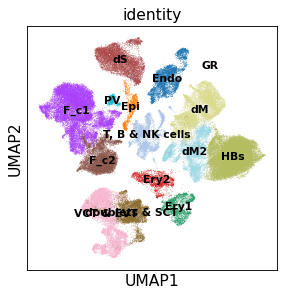

In [5]:
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

### Erythrocytes

TFRC (CD71) is the differentiation gene between mature erythrocytes (CD71-) and inmature ones, reticulocytes, (CD71+)
 https://doi.org/10.1016/j.bcmd.2018.06.004


RUVBL1, CD55 , and CD36 should also be express in reticulocytes but not in erythrocytes.



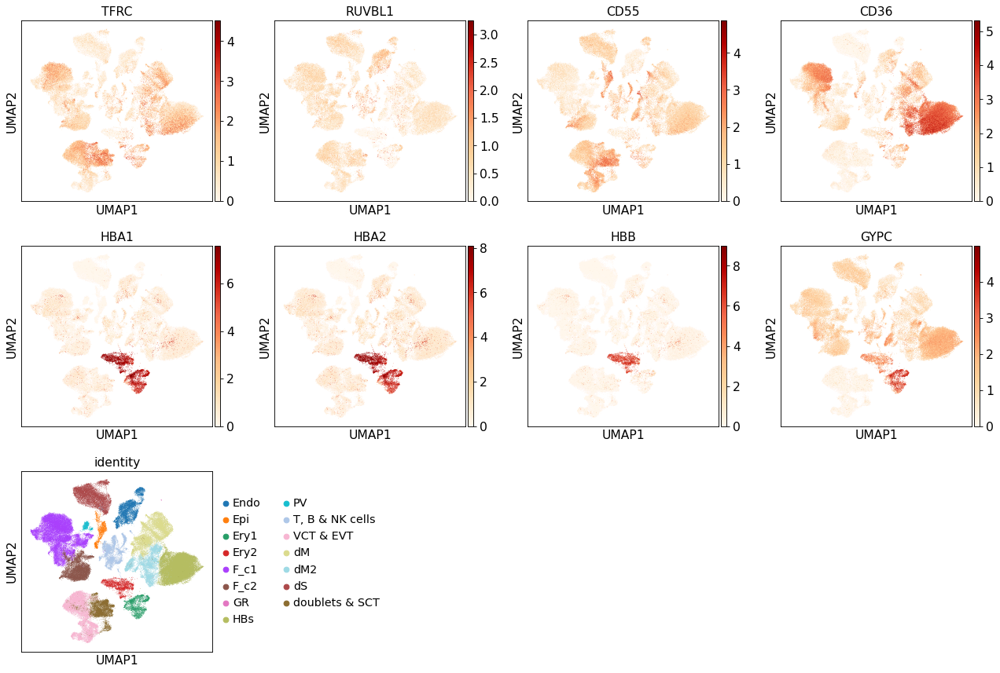

In [6]:
sc.pl.umap(adata, color=['TFRC','RUVBL1','CD55','CD36', "HBA1",'HBA2','HBB',"GYPC", 'identity'],color_map='OrRd',
           save='_scVI_latent30_erythrocyteMarkers.pdf')

In [7]:
#Selecting the cells in the desired clusters
temp_cells = adata[adata.obs['identity'] == 'Ery1']
temp_cells2= adata[adata.obs['identity'] == 'Ery2']


#converting categorical into strings to introduce new categories
adata.obs['identity']=adata.obs['identity'].astype("string")

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [8]:
#Function that changes the cluster names as indicated
# X:Y
# Being X the current name and Y the original name

temp_cells.obs['identity'] = (temp_cells.obs["identity"].map(lambda x: 
                            {"Ery1": "Ret","Ery2": "Ery",}
                            .get(x, x)).astype("category"))


temp_cells2.obs['identity'] = (temp_cells2.obs["identity"].map(lambda x: 
                            {"Ery2": "Ery",}
                            .get(x, x)).astype("category"))


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [9]:
#assigning the new categories to the cells in adata
for cell in temp_cells.obs.index:
    adata.obs['identity'][cell] = temp_cells.obs['identity'][cell]

for cell in temp_cells2.obs.index:
    adata.obs['identity'][cell] = temp_cells2.obs['identity'][cell]

#Returning strings into categorical 
adata.obs['identity']=adata.obs['identity'].astype("category")

In [10]:
del(temp_cells)
del(temp_cells2)

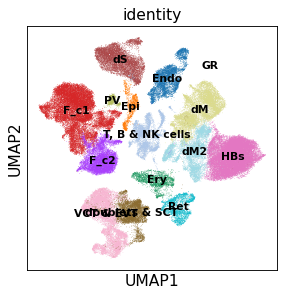

In [11]:
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

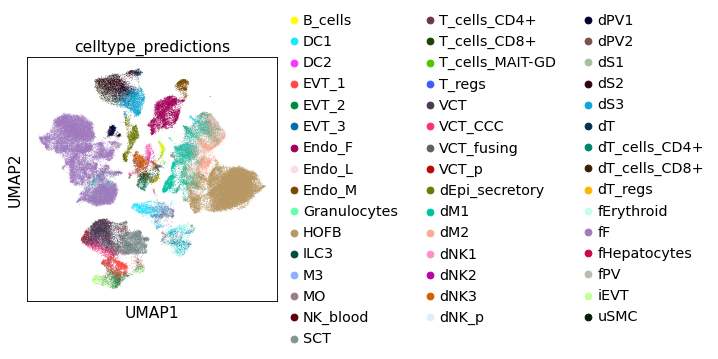

In [12]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['celltype_predictions' ], save='_scVI_latent30_labTransfering3.1.pdf')

In [13]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

## Increasing resolution of dS, Endo, NK, T, and cells

In [69]:
def identityTransfer(adata_CellsNewID, adata, field='identity'):
    
    '''
    Function to transfer the value in a .obs column, modifying only the cells included in adata_CellsNewID
    
    Parameters:
        adata_CellsNewID: anndata object with cells. These should have in their .obs[field] the new values to be transfer to adata
        adata: anndata object to modify. The value in .obs[field] will be modifies for all the cells in adata_CellsNewID
        field: column name in .obs to operate in
        
    '''
    
    #converting categorical into strings to introduce new categories
    adata.obs[field]=adata.obs[field].astype("string")


    #assigning the new categories to the cells in adata
    for cell in adata_CellsNewID.obs.index:
        adata.obs[field][cell] = adata_CellsNewID.obs[field][cell]

    #Returning strings into categorical 
    adata.obs[field]=adata.obs[field].astype("category")
    
    return(adata)

### -- dS --

In [15]:
temp_cells = adata[adata.obs['identity'] == 'dS']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [16]:
#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=25, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.4)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:01)


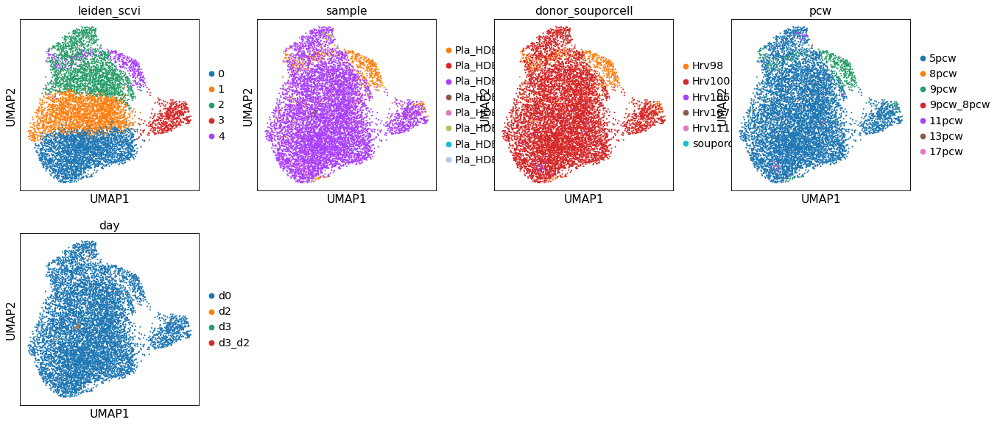

In [17]:
#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'sample','donor_souporcell', 'pcw','day'])

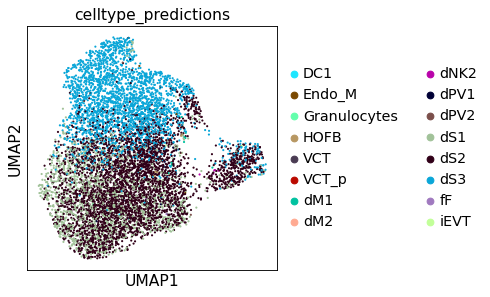

In [18]:
sc.pl.umap(temp_cells, color=["celltype_predictions"])

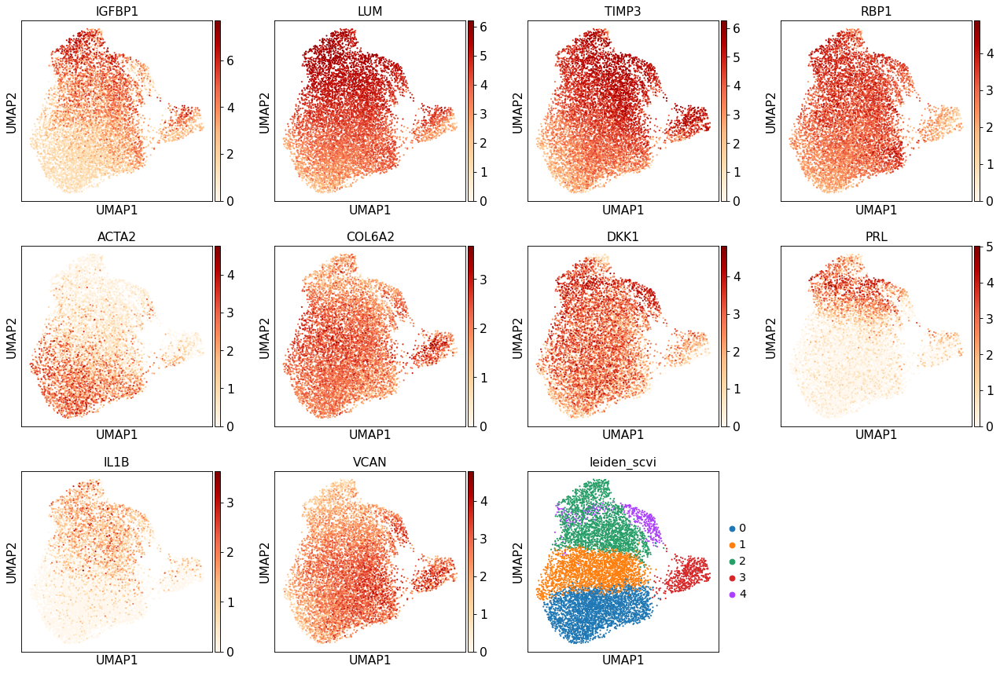

In [19]:
#These are dS markers, to help me to differentiate between the 3 sub-populations

# ACTA2 is higher in dS1
# RBP1,TIMP3 and LUM higher in dS2

sc.pl.umap(temp_cells, color=['IGFBP1', 'LUM','TIMP3','RBP1', 'ACTA2', 'COL6A2', 'DKK1',
                         'PRL','IL1B', 'VCAN','leiden_scvi'],color_map='OrRd')

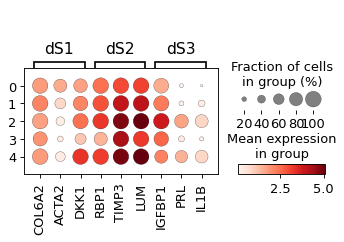

In [21]:
marker_genes = {
    'dS1':{'COL6A2','ACTA2','DKK1'}, 
    'dS2': {'LUM','TIMP3','RBP1'},
    'dS3':{'IGFBP1','PRL','IL1B'}
}

sc.pl.dotplot(temp_cells, marker_genes, groupby='leiden_scvi', use_raw=False)

In [22]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden_scvi']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"0": "dS1","1": "dS2","2": "dS3","3": "dS2","4": "dS3"}
                            .get(x, x)).astype("category"))

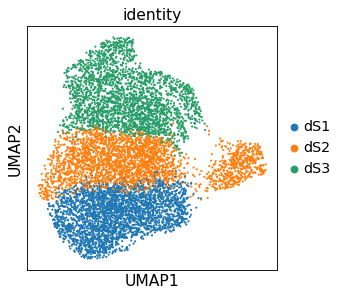

In [23]:
sc.pl.umap(temp_cells, color=['identity'],color_map='OrRd')

In [24]:
adata= identityTransfer(temp_cells, adata)

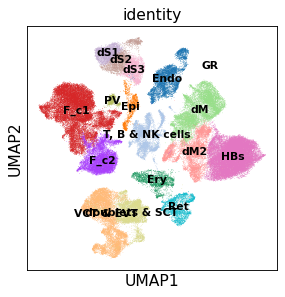

In [25]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [26]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

### -- Endo --

In [27]:
temp_cells = adata[adata.obs['identity'] == 'Endo']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [28]:
# Run PCA
#sc.tl.pca(temp_cells)

#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=25, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.2)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


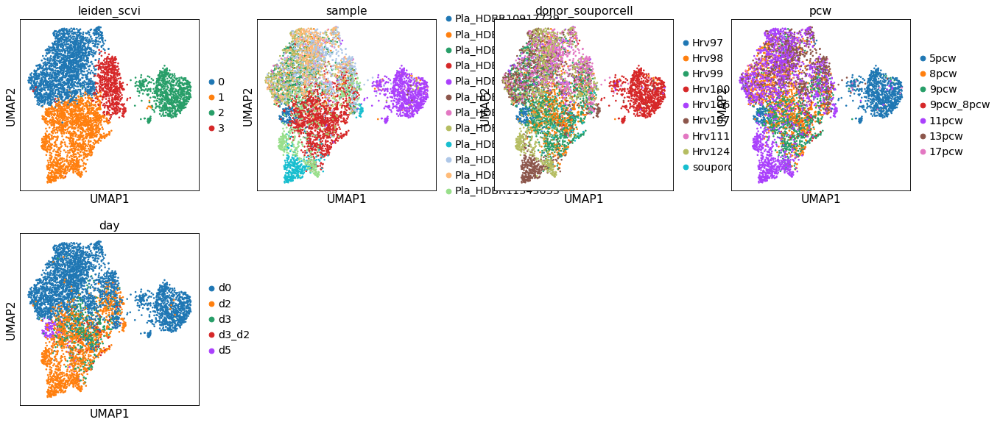

In [29]:
#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'sample','donor_souporcell', 'pcw','day'])

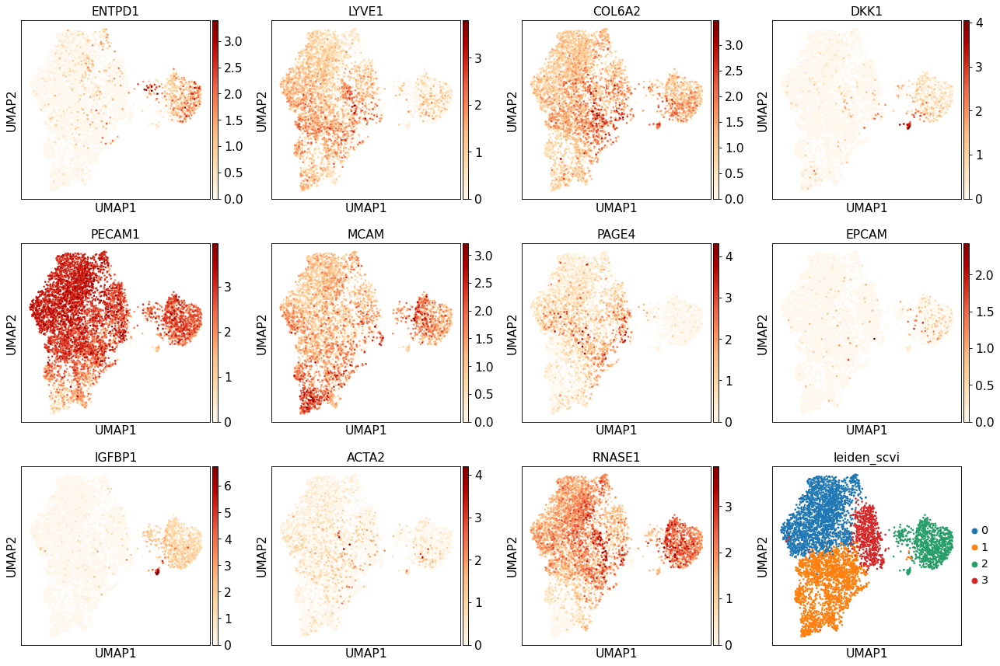

In [30]:
sc.pl.umap(temp_cells, color=[ 'ENTPD1', 'LYVE1', 'COL6A2', 'DKK1','PECAM1','MCAM',
                         'PAGE4','EPCAM', 'IGFBP1', 'ACTA2','RNASE1',
                         'leiden_scvi'],color_map='OrRd')

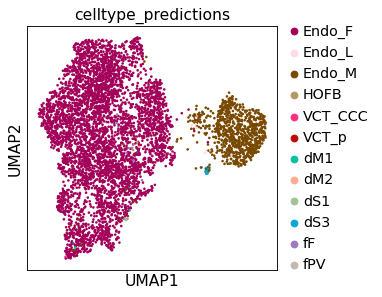

In [31]:
sc.pl.umap(temp_cells, color=["celltype_predictions"])

In [32]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden_scvi']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"0": "Endo f", "1": "Endo l", "2": "Endo m", "3": "Endo f"}
                            .get(x, x)).astype("category"))

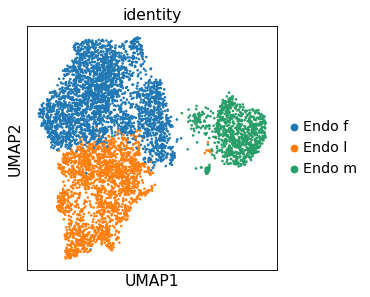

In [33]:
sc.pl.umap(temp_cells, color=['identity'],color_map='OrRd')

In [34]:
adata= identityTransfer(temp_cells, adata)

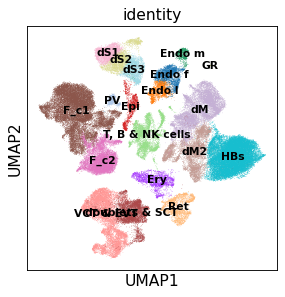

In [35]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [36]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

### --- Epi ---  

In [37]:
temp_cells = adata[adata.obs['identity'] == 'Epi']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [38]:
#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=25, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.1)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


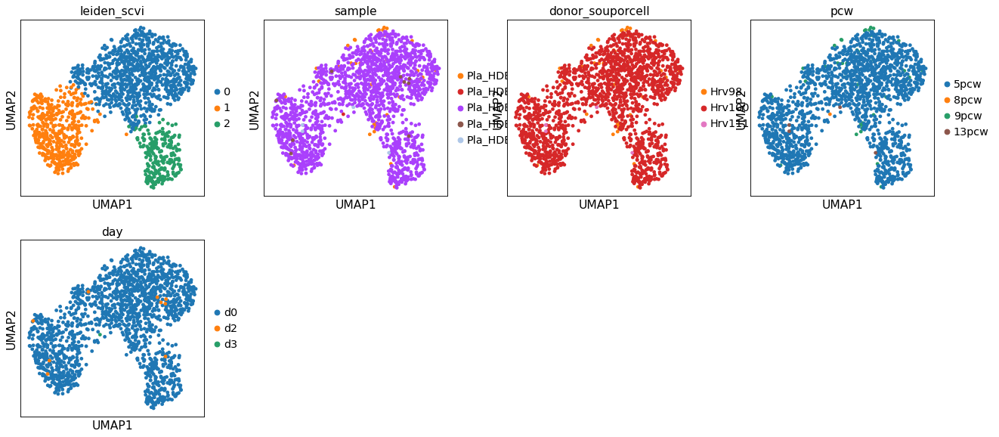

In [39]:
#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'sample','donor_souporcell', 'pcw','day'])

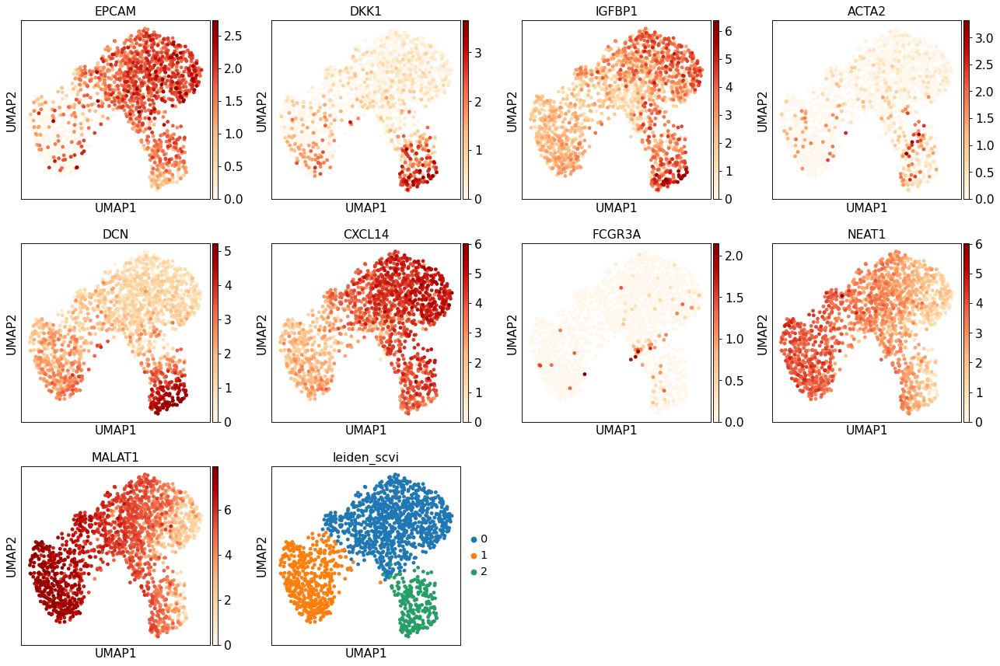

In [40]:
sc.pl.umap(temp_cells, color=[ 'EPCAM','DKK1', 'IGFBP1', 'ACTA2','DCN', 'CXCL14','FCGR3A','NEAT1','MALAT1',
                         'leiden_scvi'],color_map='OrRd')

In [41]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden_scvi']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"0": "Epi 1", "1": "Epi 2", "2": "Epi 1"}
                            .get(x, x)).astype("category"))

In [42]:
adata= identityTransfer(temp_cells, adata)

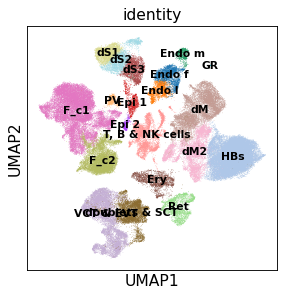

In [43]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [44]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

In [56]:
#adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

KeyboardInterrupt: 

### --- Fibroblasts ---  

In [45]:
#Selecting the cells in the desired clusters
temp_cells = adata[adata.obs['identity'] == 'F_c1']
temp_cells2= adata[adata.obs['identity'] == 'F_c2']

temp_cells = temp_cells.concatenate(temp_cells2, index_unique=None)

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [46]:
#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=25, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.1)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:03)


... storing 'sample' as categorical
... storing 'souporcell_id' as categorical
... storing 'leiden_pca' as categorical
... storing 'celltype_predictions' as categorical
... storing 'souporcell_MFgenotype' as categorical
... storing 'identity' as categorical


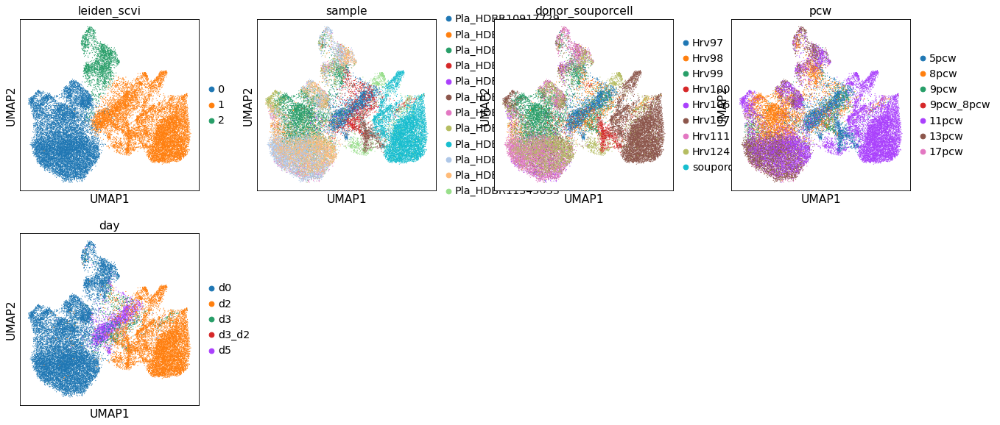

In [47]:
#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'sample','donor_souporcell', 'pcw','day'])

#### Fibroblasts differential markers

F1: DKK1, SERPINE2


F2: PDGFRB, AGTR1

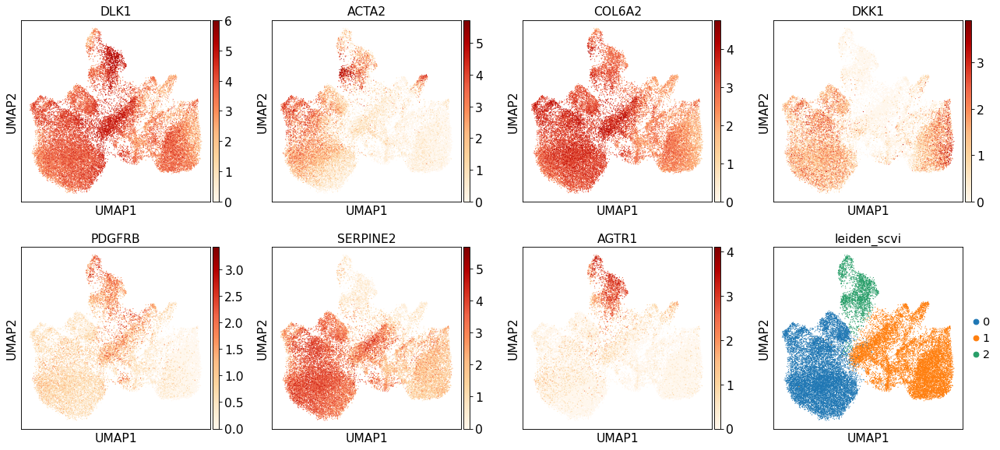

In [48]:

sc.pl.umap(temp_cells, color=['DLK1', 'ACTA2', 'COL6A2', 'DKK1','PDGFRB','SERPINE2','AGTR1',
                         'leiden_scvi'],color_map='OrRd')

In [49]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden_scvi']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"0": "F1", "1": "F1", "2": "F2"}
                            .get(x, x)).astype("category"))

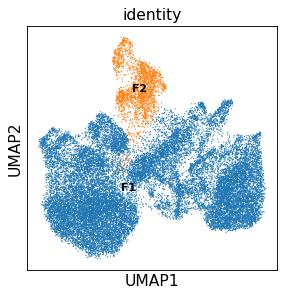

In [50]:
# use scVI imputed values for plottin
sc.pl.umap(temp_cells, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [51]:
adata= identityTransfer(temp_cells, adata)

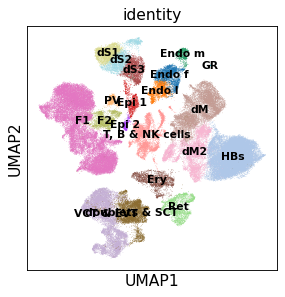

In [52]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [53]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

In [4]:
adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

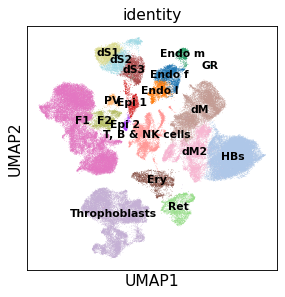

In [15]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')


### -- Throphoblasts --

In [13]:
#converting categorical into strings to introduce new categories
adata.obs['identity']=adata.obs['identity'].astype("string")


#Function that changes the cluster names as indicated. I will merge the dMs to later be
# clustered together
adata.obs['identity'] = (adata.obs["identity"].map(lambda x: 
                            {"doublets & SCT": "Throphoblasts", "VCT & EVT": "Throphoblasts"}
                            .get(x, x)).astype("category"))

In [16]:
temp_cells = adata[adata.obs['identity'] == 'Throphoblasts']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [44]:
#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=20, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.2)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:01)


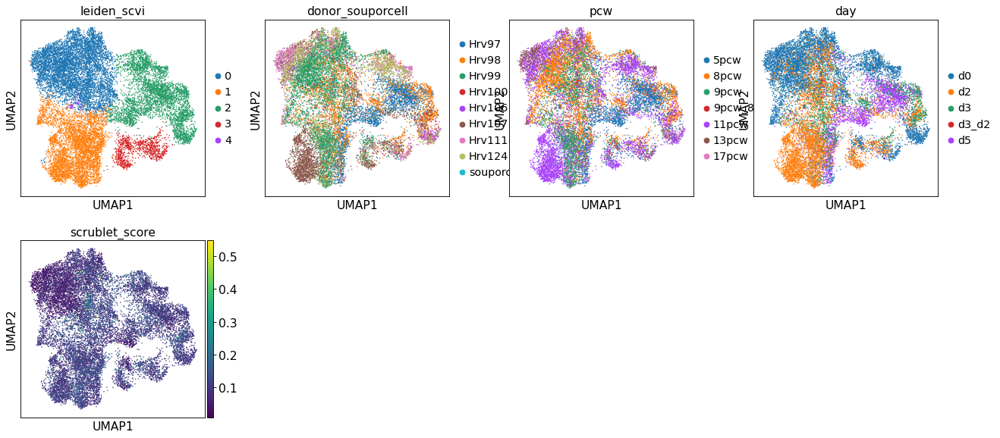

In [45]:

#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'donor_souporcell', 'pcw','day',"scrublet_score"])

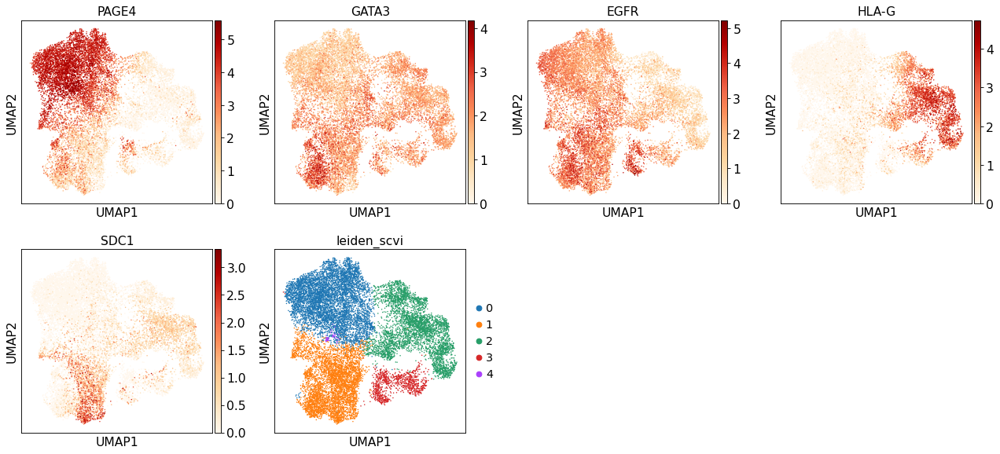

In [46]:
sc.pl.umap(temp_cells, color=['PAGE4', 'GATA3', 'EGFR', 'HLA-G','SDC1','leiden_scvi']
           ,color_map='OrRd')

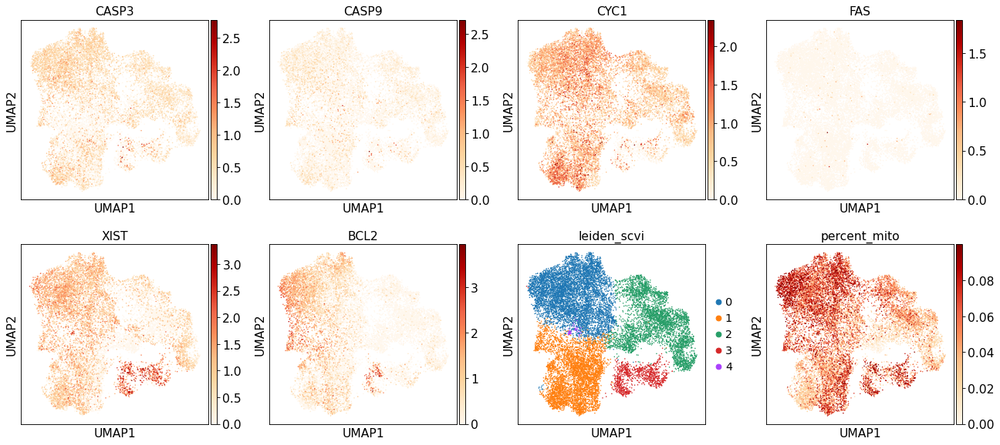

In [64]:
sc.pl.umap(temp_cells, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'leiden_scvi', 'percent_mito'],
           color_map='OrRd')

ranking genes
    finished: added to `.uns['rank_genes_groups_wilcox']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:43)


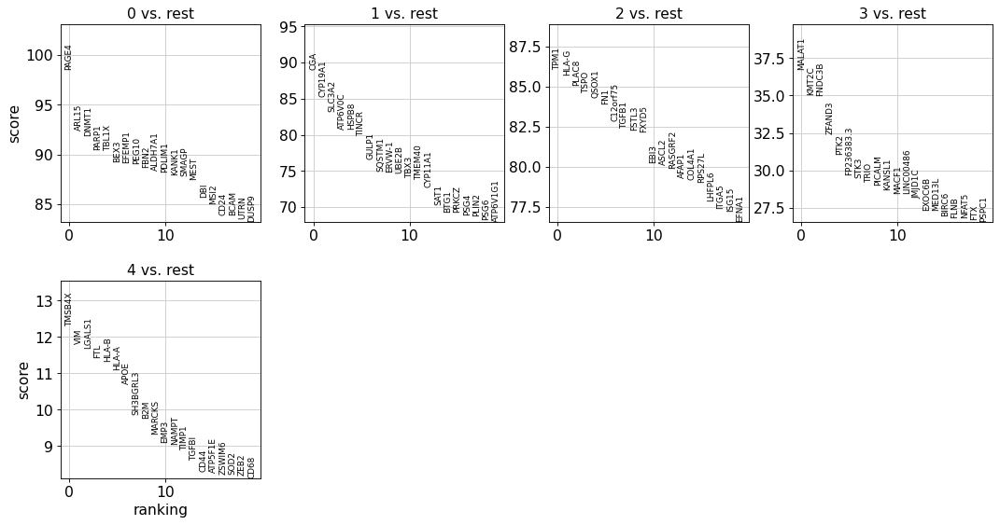

In [53]:
sc.tl.rank_genes_groups(
    temp_cells,
    "leiden_scvi",
    method="wilcoxon",
    
    key_added="rank_genes_groups_wilcox",
    n_genes=20,
)
sc.pl.rank_genes_groups(temp_cells, key="rank_genes_groups_wilcox", sharey=False, n_genes=20, show=True)

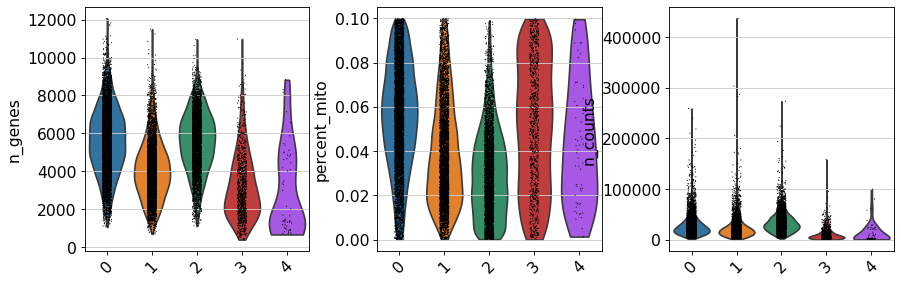

In [56]:
sc.pl.violin(temp_cells, keys=["n_genes",'percent_mito','n_counts'], groupby='leiden_scvi',rotation=45)

In [58]:
#STK3 and MALAT1 are markers or estress
pd.DataFrame(temp_cells.uns['rank_genes_groups_wilcox']['names']).head(10)

,0,1,2,3,4
0,PAGE4,CGA,TPM1,MALAT1,TMSB4X
1,ARL15,CYP19A1,HLA-G,KMT2C,VIM
2,DNMT1,SLC3A2,PLAC8,FNDC3B,LGALS1
3,PARP1,ATP6V0C,TSPO,ZFAND3,FTL
4,TBL1X,HSPB8,QSOX1,PTK2,HLA-B
5,BEX3,TINCR,FN1,FP236383.3,HLA-A
6,EFEMP1,GULP1,C12orf75,STK3,APOE
7,PEG10,SQSTM1,TGFB1,TRIO,SH3BGRL3
8,FBN2,ERVW-1,FSTL3,PICALM,B2M
9,ALDH7A1,UBE2B,FXYD5,KANSL1,MARCKS


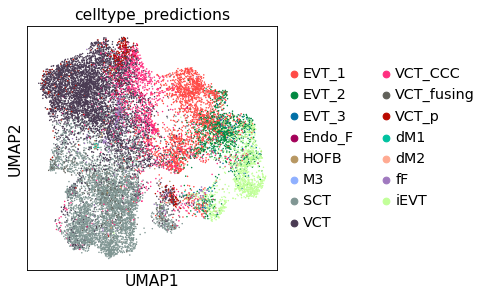

In [28]:
sc.pl.umap(temp_cells, color=["celltype_predictions"],legend_loc='on data',legend_fontsize='x-small')

In [66]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden_scvi']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"0": "VCT", "1": "SCT", "2": "EVT", "3": "Del", "4": "Del"}
                            .get(x, x)).astype("category"))

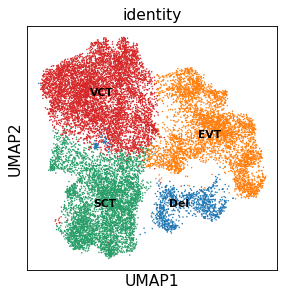

In [67]:
# use scVI imputed values for plottin
sc.pl.umap(temp_cells, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [70]:
adata= identityTransfer(temp_cells, adata)

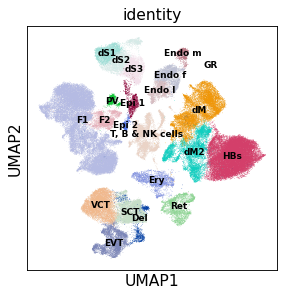

In [73]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='xx-small')

In [72]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

### -- dMs --

In [74]:
#converting categorical into strings to introduce new categories
adata.obs['identity']=adata.obs['identity'].astype("string")


#Function that changes the cluster names as indicated. I will merge the dMs to later be
# clustered together
adata.obs['identity'] = (adata.obs["identity"].map(lambda x: 
                            {"dM2": "dM"}
                            .get(x, x)).astype("category"))

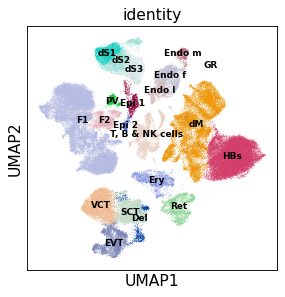

In [75]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='xx-small')

In [76]:
temp_cells = adata[adata.obs['identity'] == 'dM']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:02)


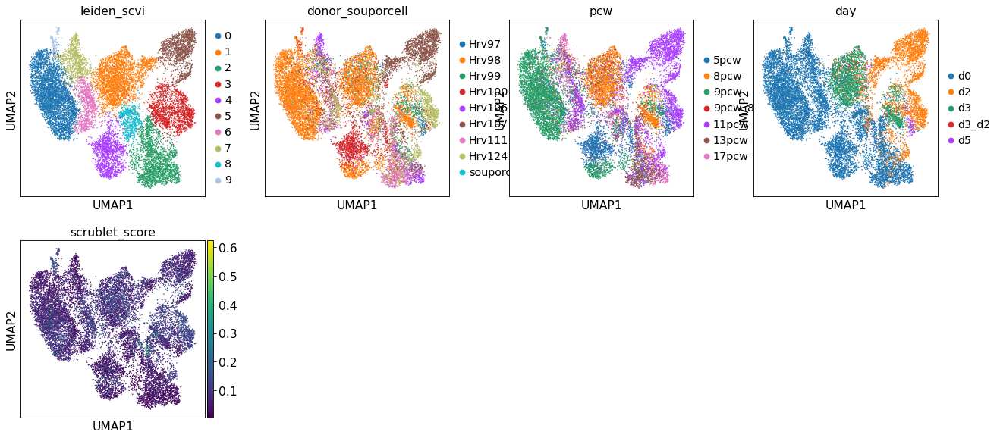

In [113]:
#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=25, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.4)

#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'donor_souporcell', 'pcw','day',"scrublet_score"])

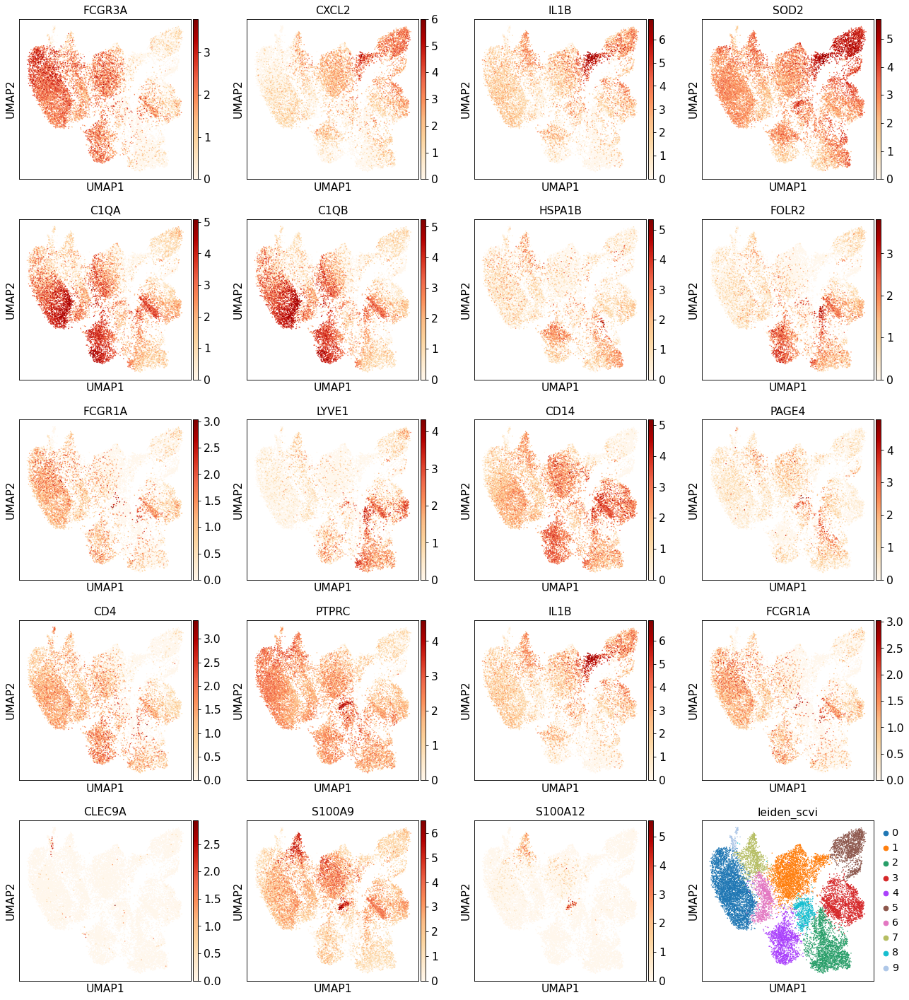

In [114]:
#dM1: CXCL2, IL1B, SOD2
#dM2: C1QB,C1QA, SEPP1, FOLR', IL1B neg
#dM3: APOC1, CD9, GCHFR
sc.pl.umap(temp_cells, color=['FCGR3A','CXCL2', 'IL1B', 'SOD2', 'C1QA','C1QB', 'HSPA1B','FOLR2','FCGR1A', 'LYVE1', 'CD14',
                              'PAGE4','CD4','PTPRC','FCGR1A',
                              'CLEC9A','S100A9','S100A12','leiden_scvi'],color_map='OrRd')

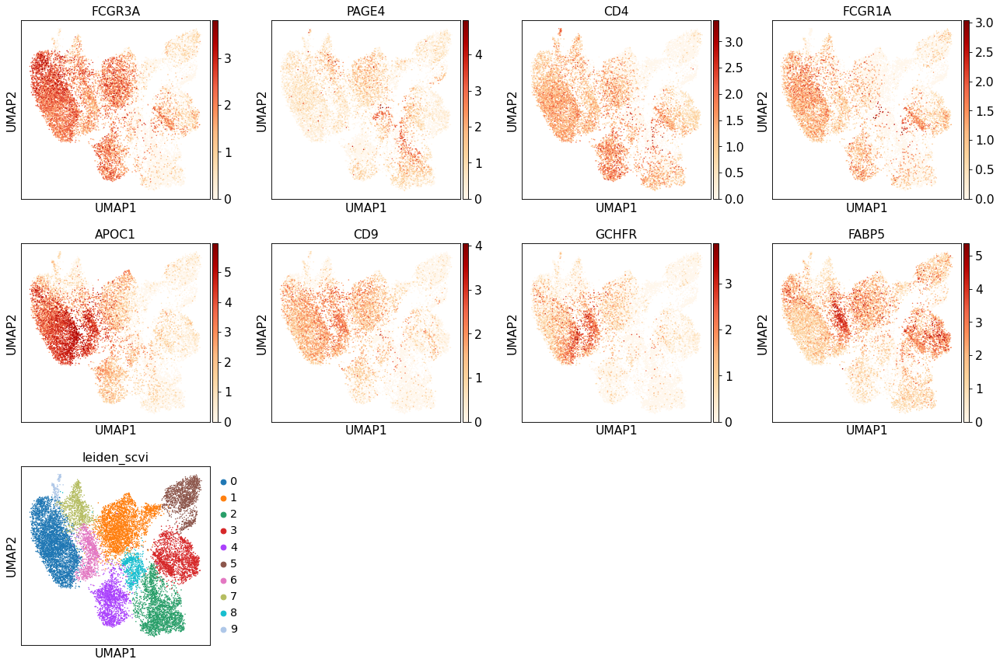

In [115]:
#dM1: CXCL2, IL1B, SOD2
#dM2: C1QB,C1QA, SEPP1, FOLR', IL1B neg
#dM3: APOC1, CD9, GCHFR, FABP5
sc.pl.umap(temp_cells, color=['FCGR3A','PAGE4','CD4','FCGR1A',
                              'APOC1', 'CD9', 'GCHFR','FABP5','leiden_scvi'],color_map='OrRd')

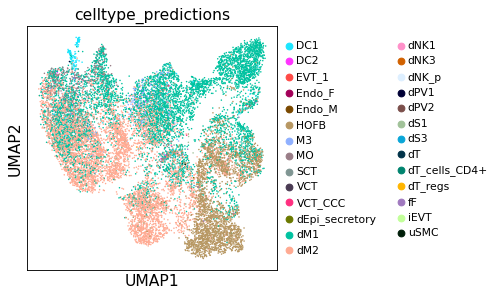

In [93]:
sc.pl.umap(temp_cells, color=["celltype_predictions"],legend_fontsize='x-small')

In [116]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden_scvi']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"0": "dM2", "1": "dM1", "2": "HBs", "3": "dM1", "4": "dM2","5": "dM1",
                             "6": "M3","7": "MO","8": "dM1", "9":"DC1"}
                            .get(x, x)).astype("category"))

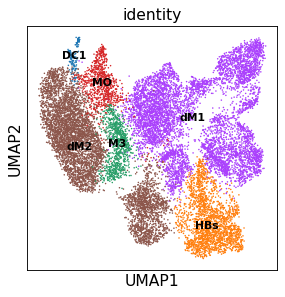

In [117]:
# use scVI imputed values for plottin
sc.pl.umap(temp_cells, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [118]:
adata= identityTransfer(temp_cells, adata)

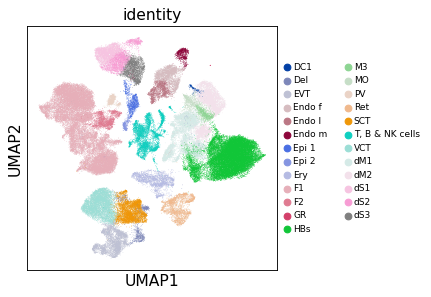

In [119]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small')

In [120]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV1.h5ad')

### Removing the GR cluster as it only has 7 cells

In [134]:
#number of cells in the cluster
adata[adata.obs['identity'] == 'GR'].n_obs

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


7

In [135]:
adata = adata[adata.obs['identity'] != 'GR']

### -- T, NK, B cells --

In [121]:
temp_cells = adata[adata.obs['identity'] == 'T, B & NK cells']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [141]:
#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=20, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


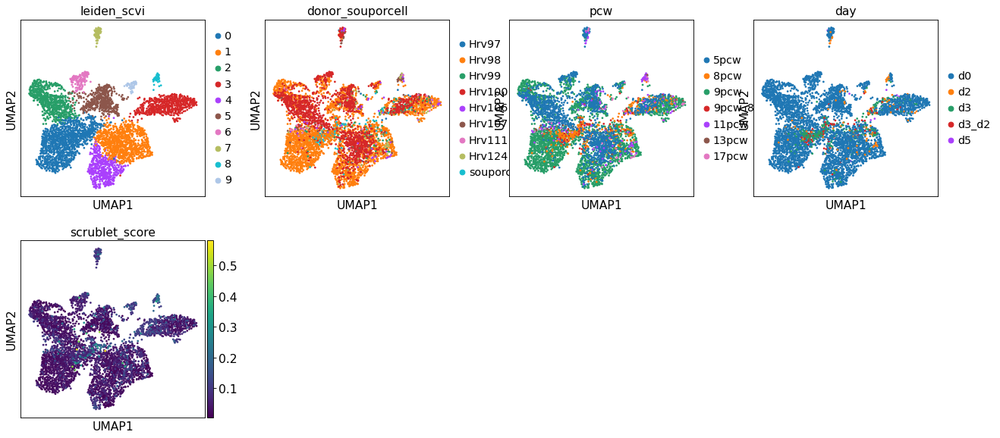

In [142]:

#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'donor_souporcell', 'pcw','day',"scrublet_score"])

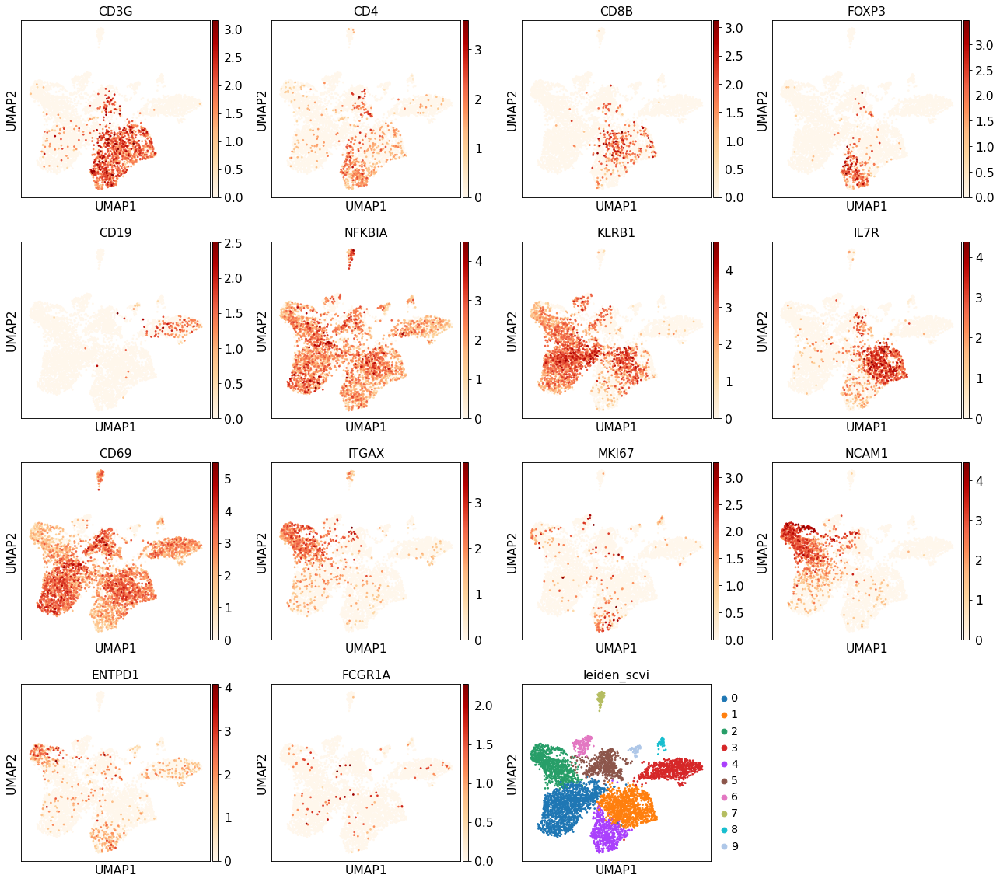

In [143]:
sc.pl.umap(temp_cells, color=[ 'CD3G', 'CD4', 'CD8B', 'FOXP3', 'CD19','NFKBIA',
                         'KLRB1','IL7R','CD69','ITGAX','MKI67','NCAM1', 'ENTPD1','FCGR1A', 
                         'leiden_scvi'],color_map='OrRd')

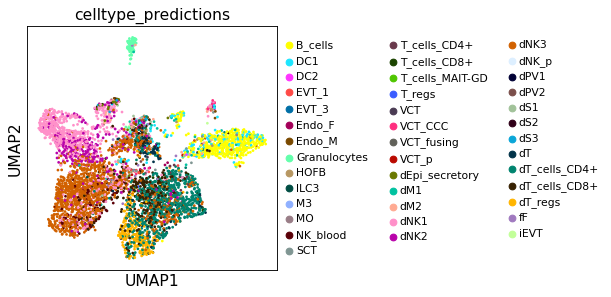

In [146]:
sc.pl.umap(temp_cells, color=["celltype_predictions"],legend_fontsize='x-small')

ranking genes
    finished: added to `.uns['rank_genes_groups_wilcox']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


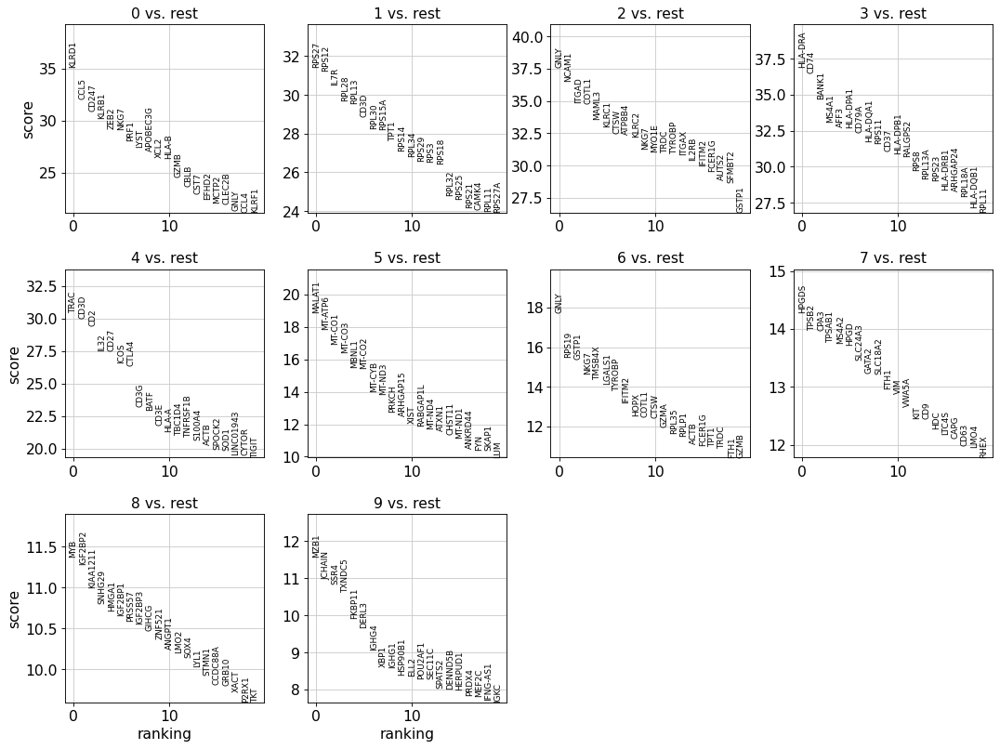

In [144]:
sc.tl.rank_genes_groups(
    temp_cells,
    "leiden_scvi",
    method="wilcoxon",
    
    key_added="rank_genes_groups_wilcox",
    n_genes=20,
)
sc.pl.rank_genes_groups(temp_cells, key="rank_genes_groups_wilcox", sharey=False, n_genes=20, show=True)

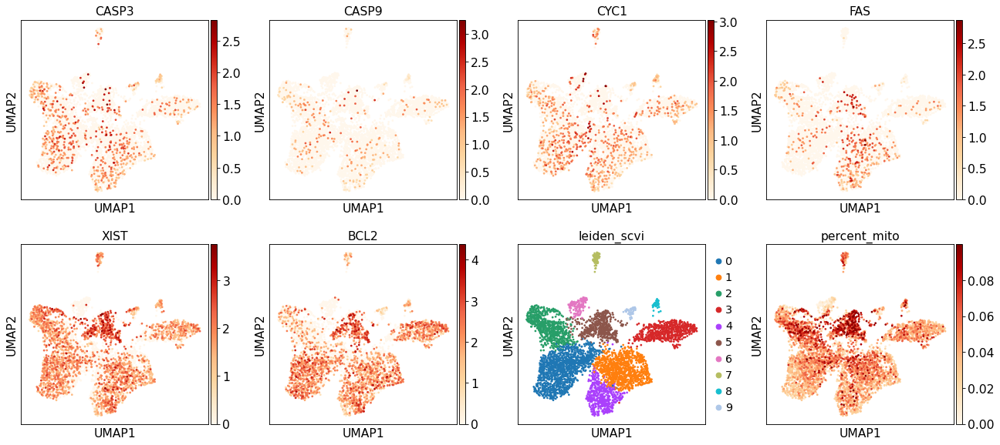

In [145]:
sc.pl.umap(temp_cells, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'leiden_scvi', 'percent_mito'],
           color_map='OrRd')

In [147]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden_scvi']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"0": "dNK3", "1": "T cells", "2": "dNK1", "3": "B cells", "4": "Tregs",
                             "5": "Del", "6": "dNK1","7": "GR","8": "Del","9": "B cells"}
                            .get(x, x)).astype("category"))

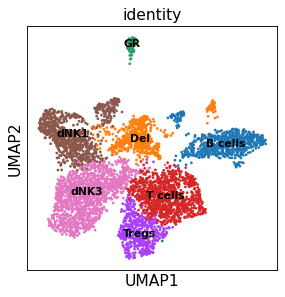

In [148]:
# use scVI imputed values for plottin
sc.pl.umap(temp_cells, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [149]:
adata= identityTransfer(temp_cells, adata)

Trying to set attribute `.obs` of view, copying.


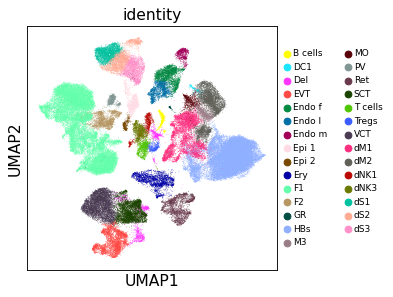

In [150]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small')

### Removing clusters of apoptotic cells

In [151]:
adata = adata[adata.obs['identity'] != 'Del']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


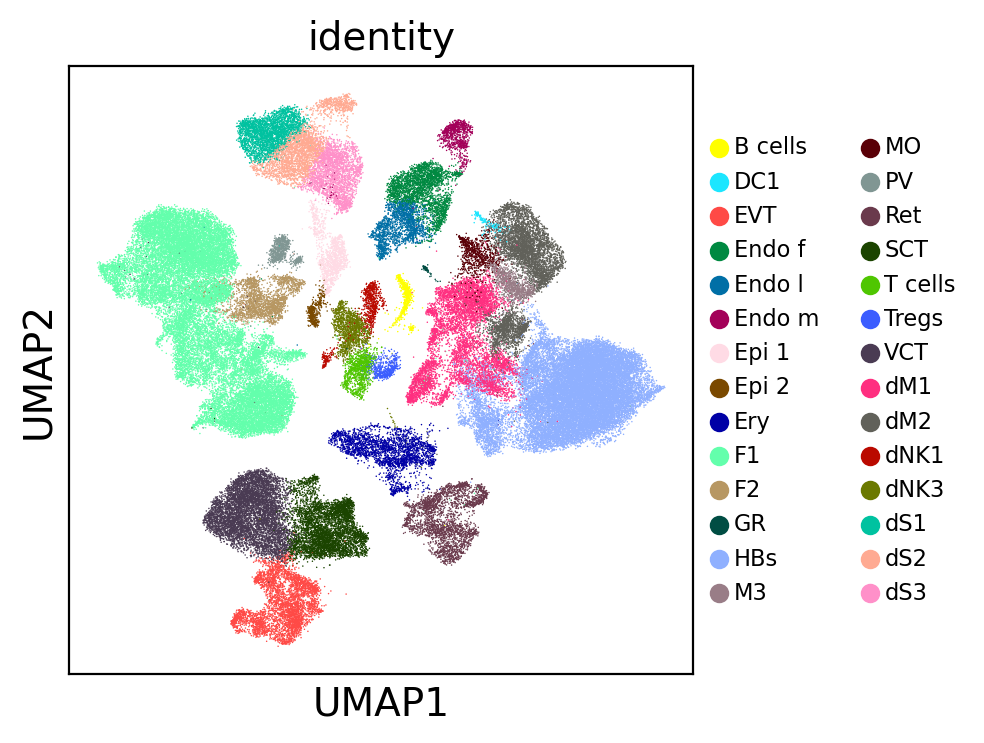

In [158]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small',save='_scVI_latent30_cleanV2.pdf', )

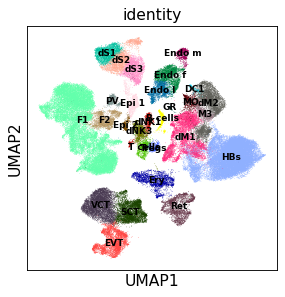

In [155]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small',legend_loc= 'on data',
           save='_scVI_latent30_cleanV2_ondata.pdf')

In [156]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV2.h5ad')

In [165]:
import matplotlib.pyplot as plt
import matplotlib as mpl

In [176]:
mpl.rcParams.keys()

KeysView(RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.html_args': [],
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': 'line',
          'axes.edgecolor': 'black',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
        

In [177]:
mpl.rcParams['figure.figsize'] = 5,5

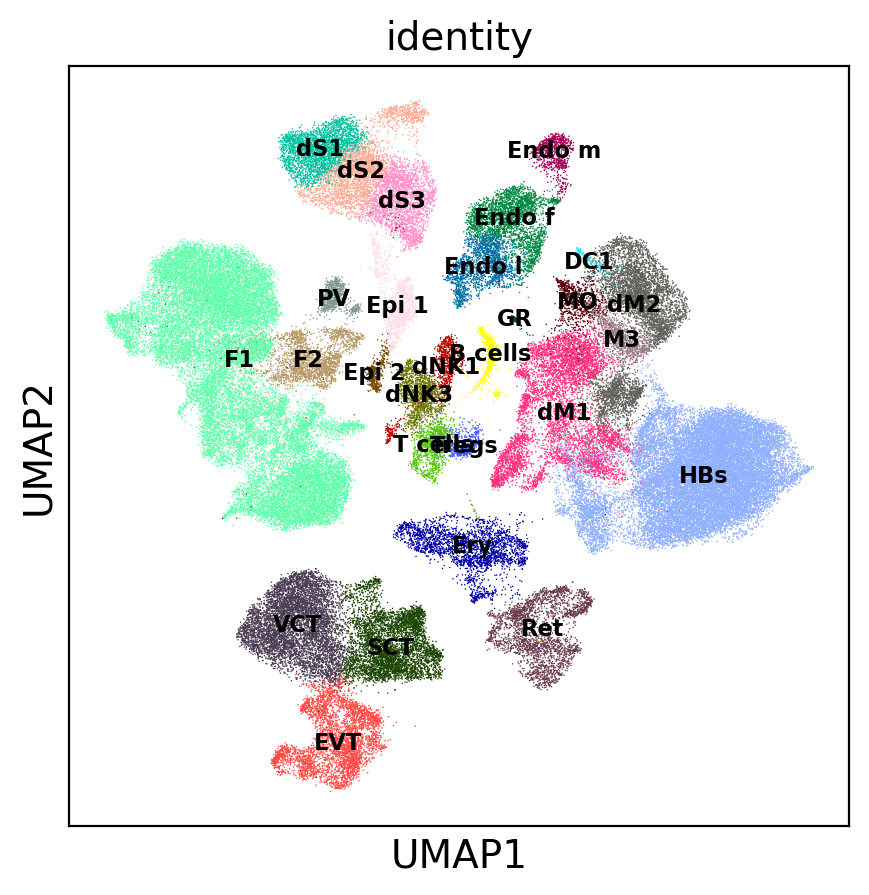

In [178]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small',legend_loc= 'on data',
           save='_scVI_latent30_cleanV2_ondata.pdf')

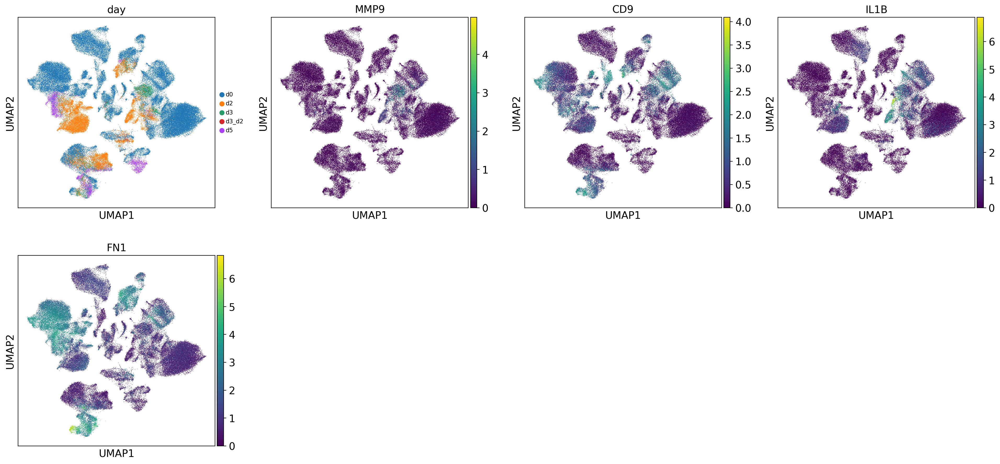

In [188]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['day', 'MMP9','CD9', 'IL1B','FN1' ],legend_fontsize='xx-small', )

In [189]:
del(temp_cells)